# NGC-6218 Age Determination

This Jupyter Notebook was created by Collin Collins on 30 March 2024

### Function: Changing .tbl to .csv

In [1]:
import csv

def convert_tbl_to_csv(input_file_name, output_file_name):
    """
    Converts a TBL file to a CSV file.

    Args:
    input_file_name (str): The path to the input TBL file.
    output_file_name (str): The path to the output CSV file.
    """
    with open(input_file_name, 'r') as tbl_file, open(output_file_name, 'w', newline='') as csv_file:
        csv_writer = csv.writer(csv_file)

        for line in tbl_file:
            columns = line.strip().split('\t')

            csv_writer.writerow(columns)

    print(f"Converted '{input_file_name}' to '{output_file_name}'.")

### Function: Read and Filter .csv Columns

In [2]:
import pandas as pd

def read_and_filter_columns(file_path, filter_keywords):
    """
    Reads a CSV file and filters columns based on specified keywords.

    Args:
    file_path (str): The path to the CSV file.
    filter_keywords (list): List of keywords to filter the columns.

    Returns:
    DataFrame: Filtered DataFrame.
    """
    df = pd.read_csv(file_path)
    filtered_columns = [col for col in df.columns if any(keyword in col for keyword in filter_keywords)]
    return df[filtered_columns]

### Function: Extract Source-Sky Columns

In [3]:
def process_source_sky_columns(df):
    """
    Processes 'Source-Sky' columns.

    Args:
    df (DataFrame): DataFrame containing 'Source-Sky' columns.

    Returns:
    DataFrame: Processed DataFrame for 'Source-Sky' data.
    """
    df_melted = df.melt(var_name='C', value_name='source-sky')
    df_melted['C'] = df_melted['C'].str.extract(r'(C\d+|T)')
    return df_melted.set_index('C')

### Function: Extract Coordinates, Transposing, Make Main DataFrame

In [4]:
def process_coordinates_columns(df):
    """
    Processes 'RA' and 'DEC' coordinate columns.

    Args:
    df (DataFrame): DataFrame containing 'RA' and 'DEC' columns.

    Returns:
    DataFrame: Processed DataFrame with 'RA' and 'DEC' data.
    """
    df_transposed = df.iloc[:, 2:].T
    df_ra = df_transposed[df_transposed.index.str.contains('RA')].reset_index().rename(columns={0: 'RA'})
    df_dec = df_transposed[df_transposed.index.str.contains('DEC')].reset_index().rename(columns={0: 'DEC'})
    df_ra['C'] = df_ra['index'].str.extract(r'(C\d+|T)')
    df_dec['C'] = df_dec['index'].str.extract(r'(C\d+|T)')
    return pd.merge(df_ra[['C', 'RA']], df_dec[['C', 'DEC']], on='C').set_index('C')

### Function: Convert RA and DEC to Sexigesimal

In [5]:
from astropy.coordinates import SkyCoord  
import astropy.units as u 

def convert_to_sexagesimal(row):
    """
    Converts RA and Dec coordinates to sexagesimal format.

    Args:
    row (Series): A pandas Series object containing 'RA' and 'DEC' values.

    Returns:
    Series: A pandas Series containing the converted 'RA' and 'DEC' in sexagesimal format.
    """
    # Creating a SkyCoord object with RA in hour angle units and Dec in degree units
    coord = SkyCoord(ra=row['RA']*u.hourangle, dec=row['DEC']*u.deg)

    # Converting RA and Dec to sexagesimal format (H:M:S for RA and D:M:S for Dec)
    # and returning them as a pandas Series
    return pd.Series({
        'RA-sexy': coord.ra.to_string(unit=u.hour, sep=':'),  # Formatting RA in sexagesimal format
        'DEC-sexy': coord.dec.to_string(unit=u.degree, sep=':')  # Formatting Dec in sexagesimal format
    })

### Function: Calculate Zero Magnitude

In [6]:
import numpy as np

def calculate_mag_0(mag, counts_norm_b):
    """
    Calculates the corrected magnitude based on a given magnitude and normalized counts.

    Args:
    mag (float): The original magnitude value.
    counts_norm_b (float): The normalized counts (brightness) value.

    Returns:
    float: The corrected magnitude value.
    """
    return mag + 2.5 * np.log10(counts_norm_b)

## Calling Functions and Performing Analysis

### Convert .tbl to .csv

In [7]:
# Replace these file names with your actual file names
convert_tbl_to_csv('data/775-b.tbl', 'data/775-b.csv')
convert_tbl_to_csv('data/775-v.tbl', 'data/775-v.csv')

Converted 'data/775-b.tbl' to 'data/775-b.csv'.
Converted 'data/775-v.tbl' to 'data/775-v.csv'.


### Make DataFrame With Only Useful Information

In [8]:
# Main workflow for B band
df_source_sky = read_and_filter_columns('data/775-b.csv', ['Source-Sky'])
df_source_sky_processed = process_source_sky_columns(df_source_sky)

df_coordinates = read_and_filter_columns('data/775-b.csv', ['RA', 'DEC'])
df_coordinates_processed = process_coordinates_columns(df_coordinates)

df_b_band_preprocessed = df_source_sky_processed.merge(df_coordinates_processed, left_index=True, right_index=True)

# Uncomment to display the last few rows of the processed DataFrame
# df_b_band_preprocessed.tail()

In [9]:
# Main workflow for v band
df_source_sky = read_and_filter_columns('data/775-v.csv', ['Source-Sky'])
df_source_sky_processed = process_source_sky_columns(df_source_sky)

df_coordinates = read_and_filter_columns('data/775-v.csv', ['RA', 'DEC'])
df_coordinates_processed = process_coordinates_columns(df_coordinates)

df_v_band_preprocessed = df_source_sky_processed.merge(df_coordinates_processed, left_index=True, right_index=True)

# Uncomment to display the last few rows of the processed DataFrame
df_v_band_preprocessed.tail()

,source-sky,RA,DEC
C,,,
C771,810.297947,16.786029,-1.860024
C772,1767.504852,16.784939,-1.872741
C773,1266.654130,16.785385,-1.901823
C774,2664.435130,16.785048,-1.903833
C775,2618.591241,16.785228,-1.911938


### Make RA and DEC sexigesimal

In [10]:
# Apply the conversion function to each row
df_b_band_preprocessed[['RA-sexy', 'DEC-sexy']] = df_b_band_preprocessed.apply(convert_to_sexagesimal, axis=1)

df_v_band_preprocessed[['RA-sexy', 'DEC-sexy']] = df_v_band_preprocessed.apply(convert_to_sexagesimal, axis=1)

### Locating Stars Based on Aperture Number

In [11]:
# Access the row with the label 'C{label}'
row_find = df_b_band_preprocessed.loc['C637']

# Display the row
print(row_find)

source-sky         21700.908689
RA                    16.782946
DEC                   -1.895575
RA-sexy       16:46:58.60429221
DEC-sexy      -1:53:44.06878065
Name: C637, dtype: object


### Recording Known Apparent Magnitudes of The First 5 Stars

You can lookup the objects in Simbad using their RA and DEC in the headers above

In [12]:
b_mag_1 = 15.30 # C68: NGC 6218-4202
b_mag_2 = 15.41 # C636: NGC 6218-4239 
b_mag_3 = 14.621 # C637: NGC UCAC4 441-065409


v_mag_1 = 15.05 # C68: NGC 6218-4202
v_mag_2 = 14.31 # C636: NGC 6218-4239 
v_mag_3 = 13.720 # C637: NGC UCAC4 441-065409

### Normalizing Counts in B and V Bands

In [13]:
# Define the exposure times for B and V bands
exposure_time_b = 2.0051  # seconds
exposure_time_v = 2.0048  # seconds

# Normalize counts for B band
df_b_band_preprocessed['counts_norm_b'] = df_b_band_preprocessed['source-sky']/exposure_time_b
# Normalize counts for V band
df_v_band_preprocessed['counts_norm_v'] = df_v_band_preprocessed['source-sky']/exposure_time_v

### Find Average Zero Magnitude in Both Bands and Use it to Find Apparent Magnitude of All Objects

Use the counts_norm_v column above to add the right data

In [14]:
# B band zero mags
b_mag_0_1 = calculate_mag_0(b_mag_1, 16146.768308)
b_mag_0_2 = calculate_mag_0(b_mag_2, 11847.419414)
b_mag_0_3 = calculate_mag_0(b_mag_3, 10822.856062)

b_mag_0_avg = np.mean([b_mag_0_1, b_mag_0_2, b_mag_0_3])

# V band zero mags
v_mag_0_1 = calculate_mag_0(v_mag_1, 39514.657322)
v_mag_0_2 = calculate_mag_0(v_mag_2, 74018.030701)
v_mag_0_3 = calculate_mag_0(v_mag_3, 53102.443056)

v_mag_0_avg = np.mean([v_mag_0_1, v_mag_0_2, v_mag_0_3])

### Calculate the Apparent Magnitudes of All Stars

In [15]:
# Calculate all apparent magnitudes in B band
df_b_band_preprocessed['b-mag'] = b_mag_0_avg -2.5 * np.log10(df_b_band_preprocessed['counts_norm_b'])

# Calculate all apparent magnitudes in V band
df_v_band_preprocessed['v-mag'] = v_mag_0_avg -2.5 * np.log10(df_v_band_preprocessed['counts_norm_v'])

# df_b_band_preprocessed.head()
df_v_band_preprocessed.head()

,source-sky,RA,DEC,RA-sexy,DEC-sexy,counts_norm_v,v-mag
C,,,,,,,
T,15028.631330,16.784672,-1.865243,16:47:04.82023265,-1:51:54.87399919,7496.324486,16.498888
C2,8474.295838,16.784302,-1.862877,16:47:03.48823072,-1:51:46.35557044,4227.003111,17.120927
C3,1211.952629,16.784489,-1.861096,16:47:04.15861202,-1:51:39.94396344,604.525453,19.232472
C4,1989.259469,16.784656,-1.862634,16:47:04.76013548,-1:51:45.48337428,992.248339,18.694458
C5,1995.369765,16.784547,-1.864853,16:47:04.37011392,-1:51:53.47233372,995.296172,18.691128


### Calculate B-V for All Stars

In [17]:
# Selecting unique columns from each dataframe
df_b_unique = df_b_band_preprocessed[['counts_norm_b', 'b-mag']]
df_v_unique = df_v_band_preprocessed[['counts_norm_v', 'v-mag']]

# Concatenating unique columns with one set of common columns
combined_df = pd.concat([df_b_band_preprocessed[['source-sky', 'RA', 'DEC', 'RA-sexy', 'DEC-sexy']], df_b_unique, df_v_unique], axis=1)

combined_df['b-minus-v'] = combined_df['b-mag'] - combined_df['v-mag']

combined_df.head()

,source-sky,RA,DEC,RA-sexy,DEC-sexy,counts_norm_b,b-mag,counts_norm_v,v-mag,b-minus-v
C,,,,,,,,,,
T,3465.502794,16.784671,-1.865240,16:47:04.81713265,-1:51:54.86465614,1728.344120,17.279634,7496.324486,16.498888,0.780746
C2,2044.829369,16.784301,-1.862870,16:47:03.4843196,-1:51:46.33230321,1019.814158,17.852407,4227.003111,17.120927,0.731480
C3,285.551995,16.784487,-1.861089,16:47:04.15413501,-1:51:39.91988115,142.412845,19.989836,604.525453,19.232472,0.757364
C4,557.935575,16.784654,-1.862618,16:47:04.75328522,-1:51:45.42446381,278.258229,19.262589,992.248339,18.694458,0.568132
C5,515.192056,16.784547,-1.864845,16:47:04.36769379,-1:51:53.4435007,256.940829,19.349127,995.296172,18.691128,0.657999


### Make CMD Diagram

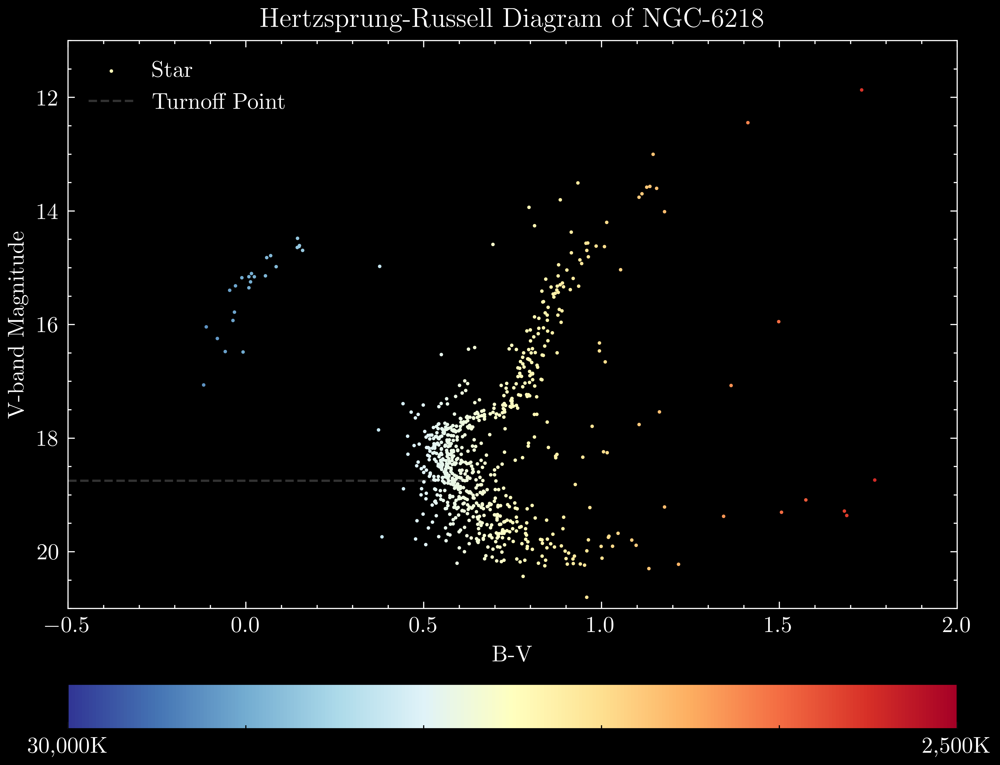

In [20]:
import matplotlib.pyplot as plt
import matplotlib.style as style
import scienceplots
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

style.use('science')
plt.rcParams['figure.dpi'] = 800

v_mag = combined_df['v-mag']
b_minus_v = combined_df['b-minus-v']

# Normalize the colormap so that -0.5 maps to 30,000K and 2 to 2,500K
norm = Normalize(vmin=-0.5, vmax=2.0)

fig, ax = plt.subplots(figsize=(7, 6))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

scatter = ax.scatter(b_minus_v, v_mag, alpha=1, s=.3, c=b_minus_v, cmap='RdYlBu_r', norm=norm, label='Star')
ax.axhline(18.75, linestyle='dashed', color='white', alpha=0.2, xmax=0.45, label='Turnoff Point')

# Adding a watermark
# ax.text(1.97, 21.7, 'Collin Collins', fontsize=6, color='gray', alpha=0.7, ha='right', va='bottom')

ax.set_xlabel('B-V', color='white')
ax.set_ylabel('V-band Magnitude', color='white')
ax.set_title('Hertzsprung-Russell Diagram of NGC-6218', color='white')
ax.grid(False)

ax.set_xlim([-0.5,2.0])
ax.set_ylim([11, 21])

ax.invert_yaxis()

ax.tick_params(colors='white', which='both')

legend = ax.legend(facecolor='black', edgecolor='white')
plt.setp(legend.get_texts(), color='white')

for spine in ax.spines.values():
    spine.set_edgecolor('white')

sm = ScalarMappable(cmap='RdYlBu_r', norm=norm)
sm.set_array([])  # This line is necessary for ScalarMappable

# Add the colorbar to the figure instead of the axes
cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', pad=0.1)
cbar.set_label(label = None, color='white')
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(colors='white')

# Label the extremes of the colorbar
cbar.set_ticks([-0.5, 2.0])
cbar.set_ticklabels(['30,000K', '2,500K'])

# Uncomment the following line to save the plot to a PNG file with specific DPI
# plt.savefig('cmd-diagram-ngc-6218.png', dpi=1000)

plt.show()

### Calculate Distance Modulus and Find Absolute Magnitude

In [21]:
import math

# Given data
apparent_magnitude_turnoff = 18.75 # locate from plot
distance_parsecs = 5.04 * 10 ** 3  # lookup the distance in parsecs

# Constants
absolute_magnitude_sun = 4.83  # Absolute magnitude of the Sun

# 1. Calculate the distance modulus
distance_modulus = 5 * math.log10(distance_parsecs) - 5

# 2. Calculate the absolute magnitude of the turnoff point
absolute_magnitude_turnoff = apparent_magnitude_turnoff - distance_modulus

# 3. Convert absolute magnitude to luminosity relative to the Sun
luminosity_relative_to_sun = 10 ** (0.4 * (absolute_magnitude_sun - absolute_magnitude_turnoff))

# 4. Estimate mass using the mass-luminosity relation (simplified version)
mass = luminosity_relative_to_sun ** (1 / 3.5)

# 5. Estimate the age of the turnoff point
age_years = 10**10 / mass**2.5


# Formatting the final results with 3 significant figures 

formatted_luminosity = f"Luminosity relative to Sun: {luminosity_relative_to_sun:.3f} times"
formatted_mass = f"Estimated mass of turnoff stars: {mass:.3f} solar masses"
formatted_age = f"Estimated age of star cluster: {age_years / 1e9:.3f} billion years"
formatted_distance_modulus = f"Distance modulus: {distance_modulus:.3f}"

formatted_results = f"{formatted_luminosity}\n{formatted_mass}\n{formatted_age}\n{formatted_distance_modulus}"

print(formatted_results)


Luminosity relative to Sun: 0.687 times
Estimated mass of turnoff stars: 0.898 solar masses
Estimated age of star cluster: 13.078 billion years
Distance modulus: 13.512


In [22]:
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
from astropy.visualization import (MinMaxInterval, ImageNormalize)

plt.rcParams['figure.dpi'] = 2000 

# Path to the final-b.fits and final-v.fits files
final_b_path = 'data/processed-m12-b.fits'
final_v_path = 'data/processed-m12-v.fits'

# # Define the non-overscan region as a slice from column 42 to 1029
# non_overscan_region = slice(1, 10000)

# def correct_and_trim(image, non_overscan_region):
#     """
#     Corrects and trims an image by removing overscan, trimming the upper 60 pixels,
#     and normalizing pixel values.

#     Parameters:
#     image (numpy.ndarray): The input image array to be corrected and trimmed.
#     non_overscan_region (slice): The slice object defining the non-overscan region.

#     Returns:
#     numpy.ndarray: The corrected, upper-trimmed, and trimmed image.
#     """
#     overscan_region_left = slice(None, non_overscan_region.start)
#     overscan_region_right = slice(non_overscan_region.stop, None)

#     overscan_value_left = np.mean(image[:, overscan_region_left])
#     overscan_value_right = np.mean(image[:, overscan_region_right])

#     overscan_value = (overscan_value_left + overscan_value_right) / 2

#     corrected_image = image - overscan_value
#     trimmed_image = corrected_image[35:, non_overscan_region]  # Trimming upper 60 pixels

#     return trimmed_image


# Loading the images
image_b = fits.getdata(final_b_path)
image_v = fits.getdata(final_v_path)

# Applying the correction and trimming function
corrected_image_b = image_b
corrected_image_v = image_v

# Manually set the normalization limits, you may need to adjust these values
vmin, vmax = np.percentile(corrected_image_b, [1, 99])  # Adjust percentiles to tweak contrast

# Apply normalization
norm_b = ImageNormalize(corrected_image_b, interval=MinMaxInterval(), vmin=8, vmax=100)
norm_v = ImageNormalize(corrected_image_v, interval=MinMaxInterval(), vmin=9, vmax=100)

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(corrected_image_b, cmap='gray_r', norm=norm_b)
axes[0].set_title('NGC 6218: B-band Frame')
axes[0].axis('off')

axes[1].imshow(corrected_image_v, cmap='gray_r', norm=norm_v)
axes[1].set_title('NGC 6218: V-band Frame')
axes[1].axis('off')

plt.tight_layout()

#plt.savefig('processed-ngc-6218.png', dpi=1000, bbox_inches='tight')

plt.show()